# Projekt: Inpainting uszkodzonych obrazów
* **Uczenie Nienadzorowane**
* **Politechnika Łódzka**  
* **SIiUM 2025/2026, Semestr zimowy**

**Grupa projektowa:**
* Piotr Jasiński 259195
* Jakub Kocałek 259196
* Filip Lecrut 259199

**Importy**

In [1]:
import torch
import gc
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from src.data.load_dataset import load_data, make_small_subset, shuffle_data
from src.data.cache import load_or_create_damaged_loader, DAMAGED_DATASET_DIR
from src.modules.autoencoder import Autoencoder
from src.modules.pca_clust import plot_clustered_images, run_clustering_pipeline
from src.raport_utils.image_display import visualize_damaged_images, visualize_reconstruction, visualize_images_inpainter, visualize_cluster_assignment, visualize_sr_results
from src.raport_utils.cache_data import cache_latent_data
from src.data.damage import create_paired_damaged_loaders, LabeledInpaintingDataset, create_inpainter_dataloader

**Flagi projektu:**
* SMALL_DATASET - trenowanie na mniejszym zbiorze danych
* SMALL_DATASET_SIZE - rozmiar mniejszego zbioru danych
* NUM WORKERS - liczba workers na CPU
* DISPLAY_SAMPLES - wyświetlanie obrazów na wykresach

In [2]:
SMALL_DATASET = False
SMALL_DATASET_SIZE = 0.01

NUM_WORKERS = max(1, (os.cpu_count() - 1) // 2)
print(NUM_WORKERS)

DISPLAY_SAMPLES = True

9


**Check devide - CUDA** 

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"PyTorch version: {torch.__version__}")

if device.type == 'cuda':
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    torch.cuda.synchronize()
    before_alloc = torch.cuda.memory_allocated(device) / 1024**2
    before_reserved = torch.cuda.memory_reserved(device) / 1024**2
    print(f"Before reset - allocated: {before_alloc:.2f} MB, reserved/cached: {before_reserved:.2f} MB")

    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats(device)
    torch.cuda.synchronize()

    after_alloc = torch.cuda.memory_allocated(device) / 1024**2
    after_reserved = torch.cuda.memory_reserved(device) / 1024**2
    print(f"After reset  - allocated: {after_alloc:.2f} MB, reserved/cached: {after_reserved:.2f} MB")
else:
    gc.collect()
    print("No CUDA device detected — performed Python garbage collection.")

Device: cuda
PyTorch version: 2.9.0+cu130
Before reset - allocated: 0.00 MB, reserved/cached: 0.00 MB
After reset  - allocated: 0.00 MB, reserved/cached: 0.00 MB


c:\Users\jasin\Unsupervised-learning---images\.venv\Lib\site-packages\torch\backends\__init__.py:46: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\Context.cpp:85.)
  self.setter(val)


**Pobieranie danych oraz tworzenie dataloaderów z poprawnymi oraz uszkodzonymi obrazami**

In [4]:
train_loader, test_loader, val_loader = load_data(add_fourth_channel=True, num_workers=NUM_WORKERS)

damaged_train_loader = load_or_create_damaged_loader(train_loader, os.path.join(DAMAGED_DATASET_DIR, 'train'), augmentation=False)
damaged_test_loader = load_or_create_damaged_loader(test_loader, os.path.join(DAMAGED_DATASET_DIR, 'test'))
damaged_val_loader = load_or_create_damaged_loader(val_loader, os.path.join(DAMAGED_DATASET_DIR, 'val'))

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

Ładowanie uszkodzonych obrazów z data/damaged_dataset\train
Tworzenie DataLoadera z obrazów w data/damaged_dataset\train
Liczba obrazów w zbiorze: 57010
Ładowanie uszkodzonych obrazów z data/damaged_dataset\test
Tworzenie DataLoadera z obrazów w data/damaged_dataset\test
Liczba obrazów w zbiorze: 12216
Ładowanie uszkodzonych obrazów z data/damaged_dataset\val
Tworzenie DataLoadera z obrazów w data/damaged_dataset\val
Liczba obrazów w zbiorze: 12218


In [5]:
if SMALL_DATASET:
    damaged_train_loader = make_small_subset(damaged_train_loader, SMALL_DATASET_SIZE)
    damaged_test_loader = make_small_subset(damaged_test_loader, SMALL_DATASET_SIZE)
    damaged_val_loader = make_small_subset(damaged_val_loader, SMALL_DATASET_SIZE)

    train_loader = make_small_subset(train_loader, SMALL_DATASET_SIZE)
    test_loader = make_small_subset(test_loader, SMALL_DATASET_SIZE)
    val_loader = make_small_subset(val_loader, SMALL_DATASET_SIZE)


**Tworzenie mieszanych zbiorów danych (oryginały + uszkodzone):**

In [6]:
shuffled_train_loader = shuffle_data(train_loader, damaged_train_loader, 1.0, 1.0)
shuffled_test_loader = shuffle_data(test_loader, damaged_test_loader, 1.0, 1.0)
shuffled_val_loader = shuffle_data(val_loader, damaged_val_loader, 1.0, 1.0)

Utworzono dataset: 57010 poprawnych + 57010 uszkodzonych = 114020 obrazów
Utworzono dataset: 12216 poprawnych + 12216 uszkodzonych = 24432 obrazów
Utworzono dataset: 12218 poprawnych + 12218 uszkodzonych = 24436 obrazów


**Przykładowe uszkodzenia:**

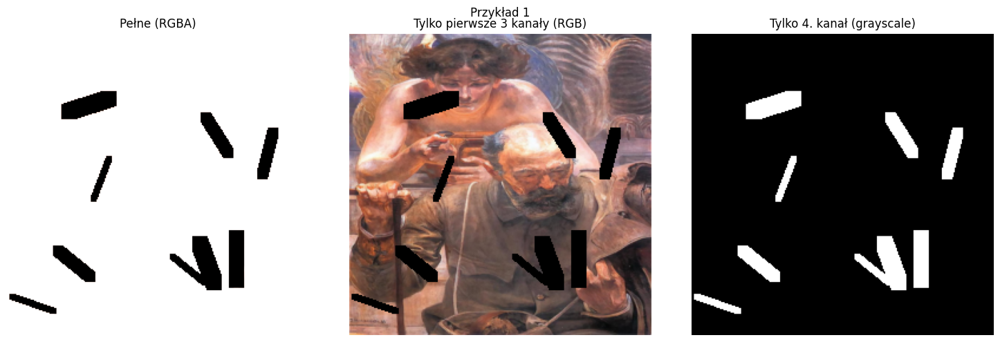

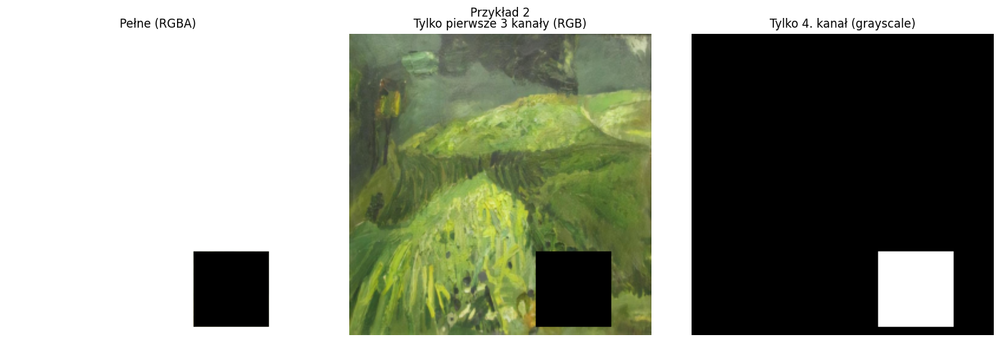

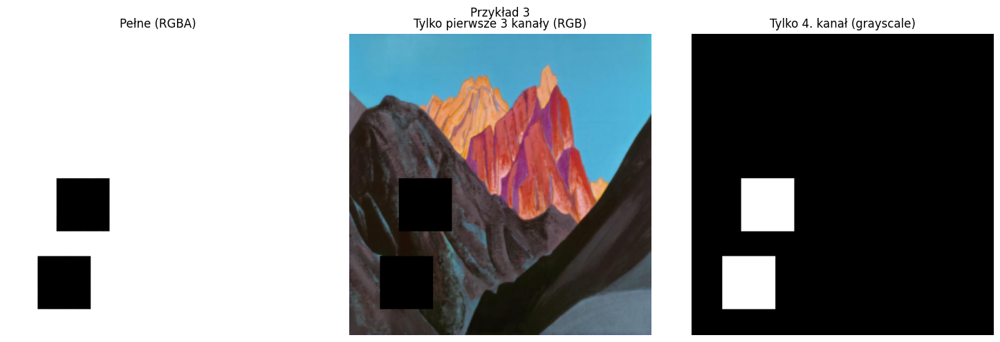

In [7]:
if DISPLAY_SAMPLES:
    visualize_damaged_images(damaged_test_loader, num_samples=3)

### Autoencoder

**Komórka ucząca lub ładująca najlepszy zapisany model**

* LOAD_BEST - pobierz wagi z najlepszego modelu
* NUM_EPOCHS - liczba epok w nauce
* FORCE_LEARNING - wymuś uczenie (od zera lub *fine-tuning*)

In [8]:
LOAD_BEST = True
NUM_EPOCHS = 40
FORCE_LEARNING = False
USE_COMET = False

autoencoder = Autoencoder(
    latent_channels=64,
    input_channels=4,
    learning_rate=0.001, 
    load_best=LOAD_BEST,
    use_comet=USE_COMET
)

if not autoencoder.model_loaded or FORCE_LEARNING:
    history = autoencoder.fit(
        train_loader=shuffled_train_loader,
        val_loader=shuffled_val_loader,
        epochs=NUM_EPOCHS, 
        early_stopping_patience=5
    )

-> Wczytywanie wag z checkpoints\best_clustering_model.pt...
-> Model załadowany! Epoka: 36 | Loss: -0.2430872598867766
Best model loaded


**Przykladowa rekonstrukcja autoencodera:**

Prezentacja rekonstrukcji (Model: Autoencoder, Latent Channels: 128):


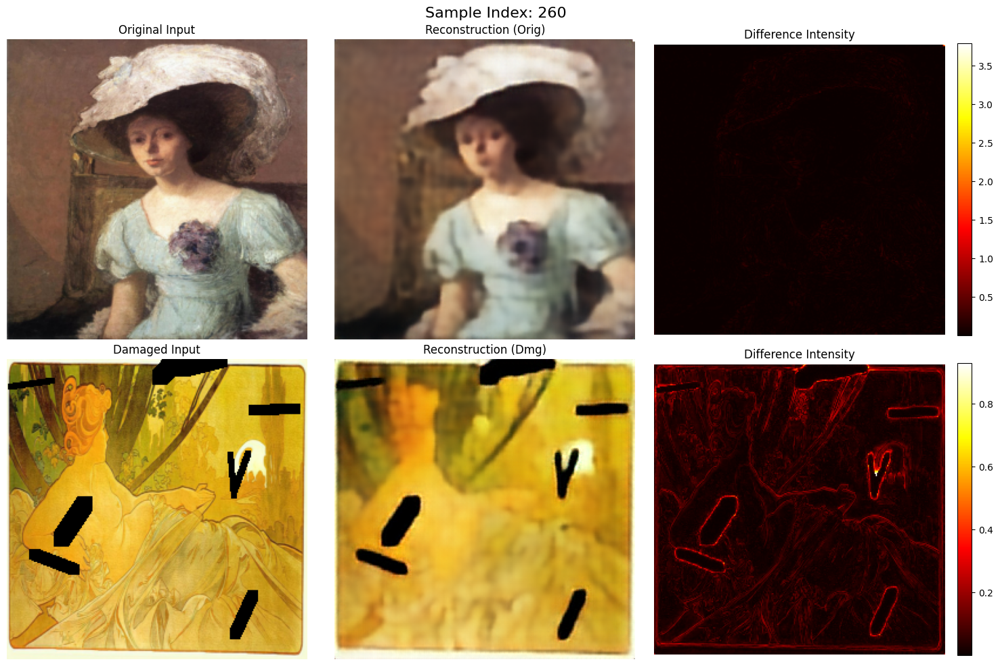

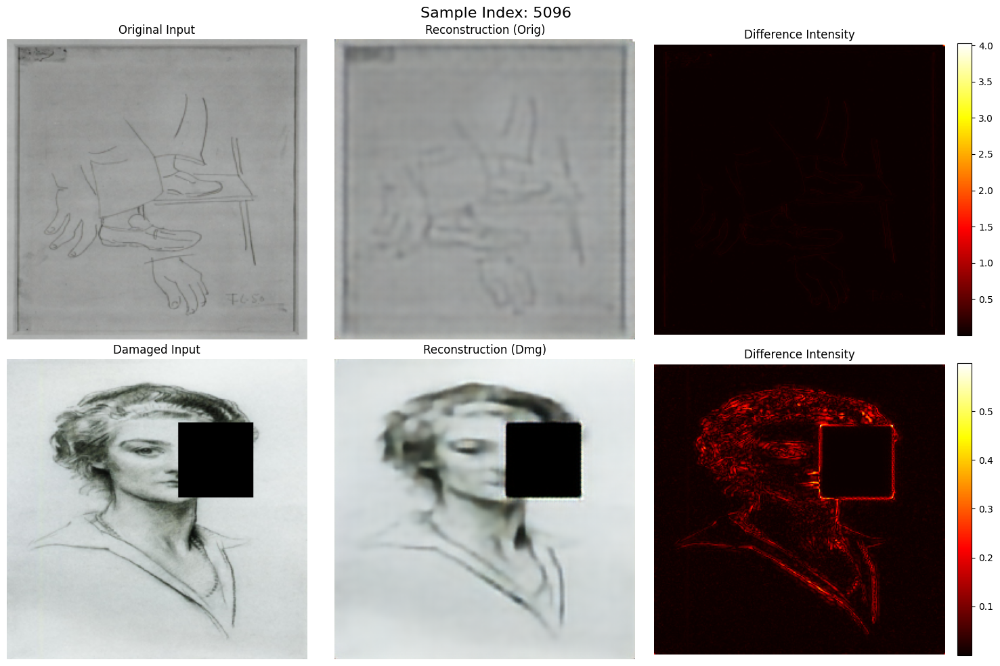

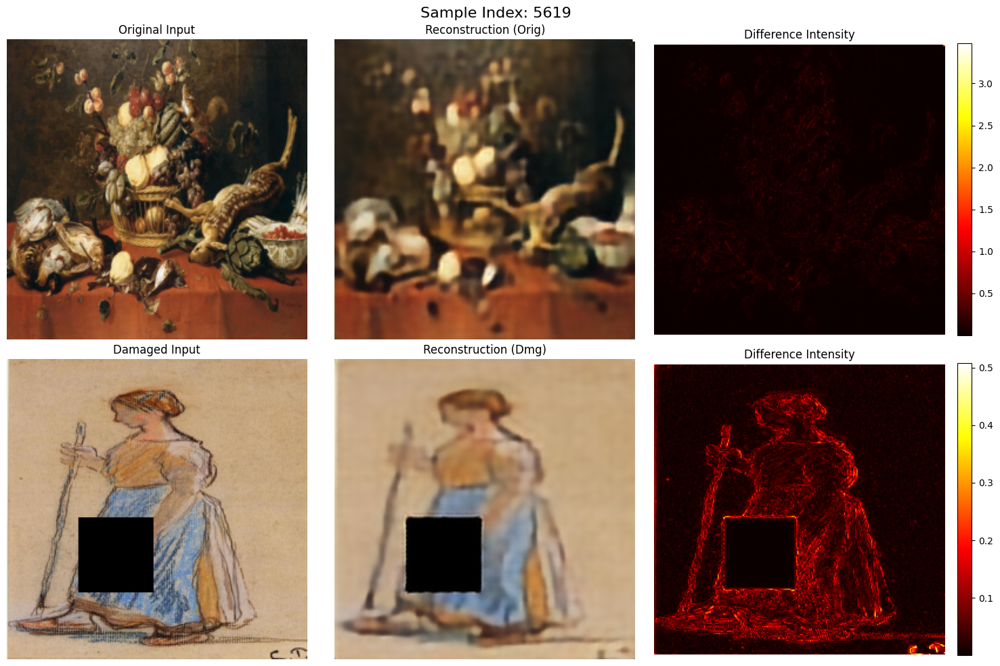


Reconstruction metrics:
MSE Original (All channels): 0.001637
MSE Damaged (All channels): 0.002635
0.002634694


In [9]:
metrics = visualize_reconstruction(
    model=autoencoder,
    test_loader=test_loader,
    damaged_test_loader=damaged_test_loader,
    num_display=3
)
print(metrics['mse_dmg'])

### Klasteryzacja

In [10]:
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.synchronize()

**Przygotowanie latentów 128x1 do klasteryzacji:**

In [11]:
dir = Path('local_logs/clustering_latent')
dir.mkdir(parents=True, exist_ok=True)
path_latent_cluster = dir / 'latent_to_cluster.npy'

FORCE_EXTRACT = False

inference_train_loader = torch.utils.data.DataLoader(
        train_loader.dataset,       
        batch_size=128,             
        shuffle=False,
        num_workers=train_loader.num_workers,
        pin_memory=False
    )

if FORCE_EXTRACT or not path_latent_cluster.exists():
    print("Rozpoczynam ekstrakcję latentów do wizualizacji (Shuffle=False)...")
    
    print("  Ekstrakcja Inference Train Set...")
    latents_to_cluster = autoencoder.extract_latent(inference_train_loader, use_projector=True)

    print(f"  Zapisywanie do: {path_latent_cluster}")
    np.save(path_latent_cluster, latents_to_cluster)

    print("Ekstrakcja zakończona.")
else:
    print("Wczytywanie latentów wizualizacyjnych z cache...")
    latents_to_cluster = np.load(path_latent_cluster)
    print("Wczytywanie zakończone.")
print(f"Rozmiar latentów: {latents_to_cluster.shape}")

Wczytywanie latentów wizualizacyjnych z cache...
Wczytywanie zakończone.
Rozmiar latentów: (57010, 128)


**Przeprowadzenie klasteryzacji na gotowych latentach:**

In [12]:
import joblib

dir = Path('local_logs/clustering_model')
dir.mkdir(parents=True, exist_ok=True)
path_cluster_models = dir / 'clustering_models.joblib'
path_cluster_labels = dir / 'clustering_labels.npy'

# True - wymusza clustering od początku, False - zczytuje gotowy model z plików
FORCE_CLUSTERING = False

if FORCE_CLUSTERING or not path_cluster_models.exists() or not path_cluster_labels.exists():
    print("Rozpoczynam proces klasteryzacji (PCA -> GMM -> UMAP)...")
    
    results = run_clustering_pipeline(
        latents=latents_to_cluster,
        min_clusters=8,
        max_clusters=12
    )
    
    train_loader_labels = results["labels"]
    trained_models = results["models"]

    print(f" Zapisywanie modeli do: {path_cluster_models}")
    joblib.dump(trained_models, path_cluster_models)
    
    print(f" Zapisywanie etykiet do: {path_cluster_labels}")
    np.save(path_cluster_labels, train_loader_labels)
    
    print("Klasteryzacja i zapis zakończone.")

else:
    print("Wczytywanie wyników klasteryzacji z cache...")
    
    trained_models = joblib.load(path_cluster_models)
    train_loader_labels = np.load(path_cluster_labels)
    print("Wczytywanie zakończone.")

pca_model = trained_models["pca"]
scaler = trained_models["scaler"]
gmm_model = trained_models["gmm"]
umap_model = trained_models["umap"]

print(f"Modele gotowe. Liczba etykiet: {len(train_loader_labels)}")

Wczytywanie wyników klasteryzacji z cache...
Wczytywanie zakończone.
Modele gotowe. Liczba etykiet: 57010


**Wizualizacja UMAP:**

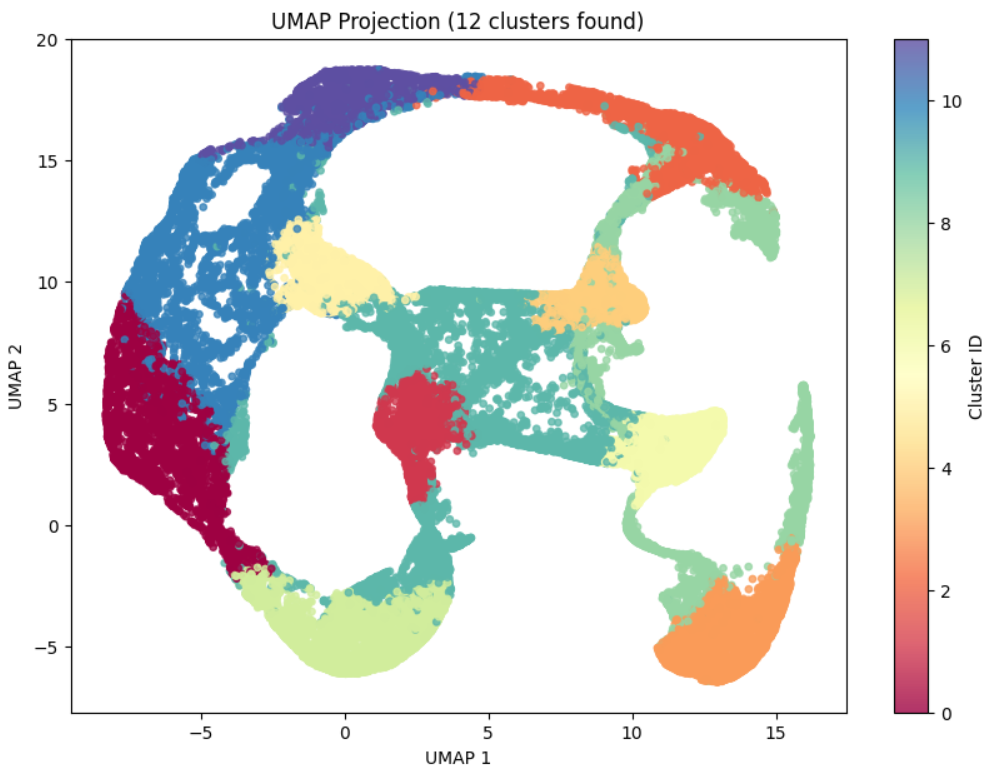

**Wizualizacja klastrów:**

In [13]:
PLOT_EXAMPLES = False

if PLOT_EXAMPLES:
    plot_clustered_images(
        images_loader=inference_train_loader,
        labels=train_loader_labels,
    )

**Test przypisywania klastrów i podziału**

Testowanie przypisywania klas (12216 obrazów)...

Rozkład klas w datasecie:
  Klasa 0: 898 obrazów (7.35%)
  Klasa 1: 810 obrazów (6.63%)
  Klasa 2: 932 obrazów (7.63%)
  Klasa 3: 875 obrazów (7.16%)
  Klasa 4: 851 obrazów (6.97%)
  Klasa 5: 861 obrazów (7.05%)
  Klasa 6: 927 obrazów (7.59%)
  Klasa 7: 1030 obrazów (8.43%)
  Klasa 8: 1407 obrazów (11.52%)
  Klasa 9: 1836 obrazów (15.03%)
  Klasa 10: 1202 obrazów (9.84%)
  Klasa 11: 587 obrazów (4.81%)

Średnia pewność przypisania: 0.9728
Min pewność: 0.3762
Max pewność: 1.0000


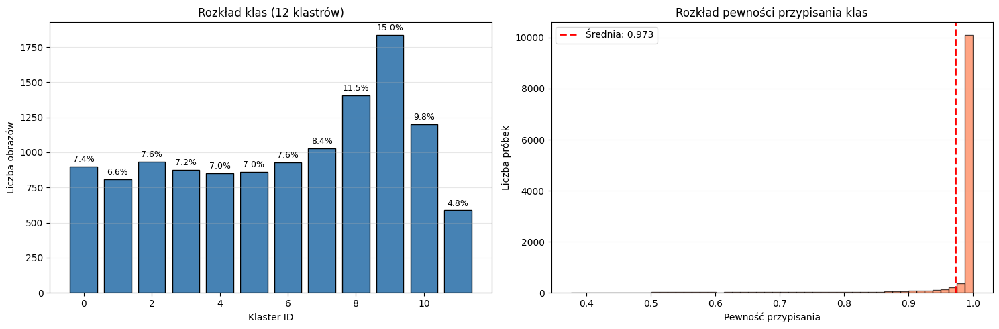

In [14]:
test_results = visualize_cluster_assignment(
    autoencoder=autoencoder,
    dataloader=test_loader,
    clustering_models=trained_models,
    device=device,
    batch_size=128
)

### Inpainter


**Przygotowanie zbioru danych do uczenia inpaintera:**

In [15]:
damaged_train_loader, damaged_test_loader, damaged_val_loader = create_paired_damaged_loaders(
    train_loader, test_loader, val_loader
)

full_train_dataset = LabeledInpaintingDataset(
    original_dataset=train_loader.dataset,      # Oryginalny dataset
    labels=train_loader_labels,     # Etykiety z gmm
    seed=42
)

train_loader_final = create_inpainter_dataloader(full_train_dataset, batch_size=128)

print(f"Batch size: {train_loader_final.batch_size}")
print(f"Liczba batchy: {len(train_loader_final)}")
print(f"Rozmiar datasetu: {len(train_loader_final.dataset)}")

sample_batch = next(iter(train_loader_final))
clean_imgs, damaged_imgs, labels = sample_batch
print(f"Wymiary clean batch: {clean_imgs.shape}")
print(f"Wymiary damaged batch: {damaged_imgs.shape}")
print(f"Wymiary labels: {labels.shape}")

Batch size: 128
Liczba batchy: 445
Rozmiar datasetu: 57010


c:\Users\jasin\Unsupervised-learning---images\src\data\damage.py:85: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  mask_temp = dilation(mask_temp, square(line_width))


Wymiary clean batch: torch.Size([128, 4, 256, 256])
Wymiary damaged batch: torch.Size([128, 4, 256, 256])
Wymiary labels: torch.Size([128])


**Zapisywanie latent space dla datasetu treningowego**

In [16]:
CACHE_INPAINTING_LATENTS = True

inpainting_latent_dir = Path('local_logs/inpainting_latent')
inpainting_latent_dir.mkdir(parents=True, exist_ok=True)

clean_latent_path = inpainting_latent_dir / 'train_z_clean.pt'
damaged_latent_path = inpainting_latent_dir / 'train_z_damaged.pt'
labels_latent_path = inpainting_latent_dir / 'train_z_labels.pt'

if CACHE_INPAINTING_LATENTS and clean_latent_path.exists() and damaged_latent_path.exists() and labels_latent_path.exists():
    print("Wczytywanie latentów inpaintingu z cache...")
    train_z_clean = torch.load(clean_latent_path)
    train_z_dmg = torch.load(damaged_latent_path)
    train_z_labels = torch.load(labels_latent_path)
    print("Wczytywanie zakończone.")
    print(f"Wymiary danych: {train_z_clean.shape}")
else:
    print("Generowanie latentów dla inpaintingu...")
    train_z_clean, train_z_dmg, train_z_labels = cache_latent_data(train_loader_final, autoencoder.encoder, device)
    
    if CACHE_INPAINTING_LATENTS:
        print(f"Zapisywanie latentów do: {inpainting_latent_dir}")
        torch.save(train_z_clean, clean_latent_path)
        torch.save(train_z_dmg, damaged_latent_path)
        torch.save(train_z_labels, labels_latent_path)
        print("Zapis zakończony.")

Wczytywanie latentów inpaintingu z cache...
Wczytywanie zakończone.
Wymiary danych: torch.Size([56960, 64, 8, 8])


**Dataloader z tensorami do uczenia Inpaintera:**

In [17]:
from torch.utils.data import TensorDataset, DataLoader

fast_train_dataset = TensorDataset(train_z_clean, train_z_dmg, train_z_labels)

fast_train_loader = DataLoader(
    fast_train_dataset,
    batch_size=128,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

**Uczenie lub załadowanie wag wytrenowanego Inpaintera:**

In [18]:
from src.modules.inpainter import LatentInpainter 
import torch
from pathlib import Path

LOAD_BEST = True
NUM_EPOCHS = 50
FORCE_LEARNING = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

checkpoint_path = Path('checkpoints/best_inpainter.pt')
if checkpoint_path.exists() and FORCE_LEARNING:
    print("Usuwam stary checkpoint...")
    checkpoint_path.unlink()

inpainter = LatentInpainter(
    latent_channels=64,     
    num_clusters=12,
    load_best=LOAD_BEST
).to(device)

if FORCE_LEARNING:
    history = inpainter.fit(
        train_loader=fast_train_loader,
        epochs=NUM_EPOCHS
    )
else:
    print(f"Załadowano model z checkpointu. Device: {device}")


Model loaded from None
Załadowano model z checkpointu. Device: cuda


In [19]:
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.synchronize()

Wylosowane indeksy: [17016 53320 44200]
[DEBUG] Input Clean Images - Min: 0.0196, Max: 1.0000, Mean: 0.5588


Extracting latents: 100%|██████████| 1/1 [00:00<00:00, 134.74it/s]

Przewidziane klasy (GMM): [9 6 6]



c:\Users\jasin\Unsupervised-learning---images\src\data\damage.py:85: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  mask_temp = dilation(mask_temp, square(line_width))


[DEBUG] Repaired Output - Min: -0.0228, Max: 5.2830, Mean: 0.5582


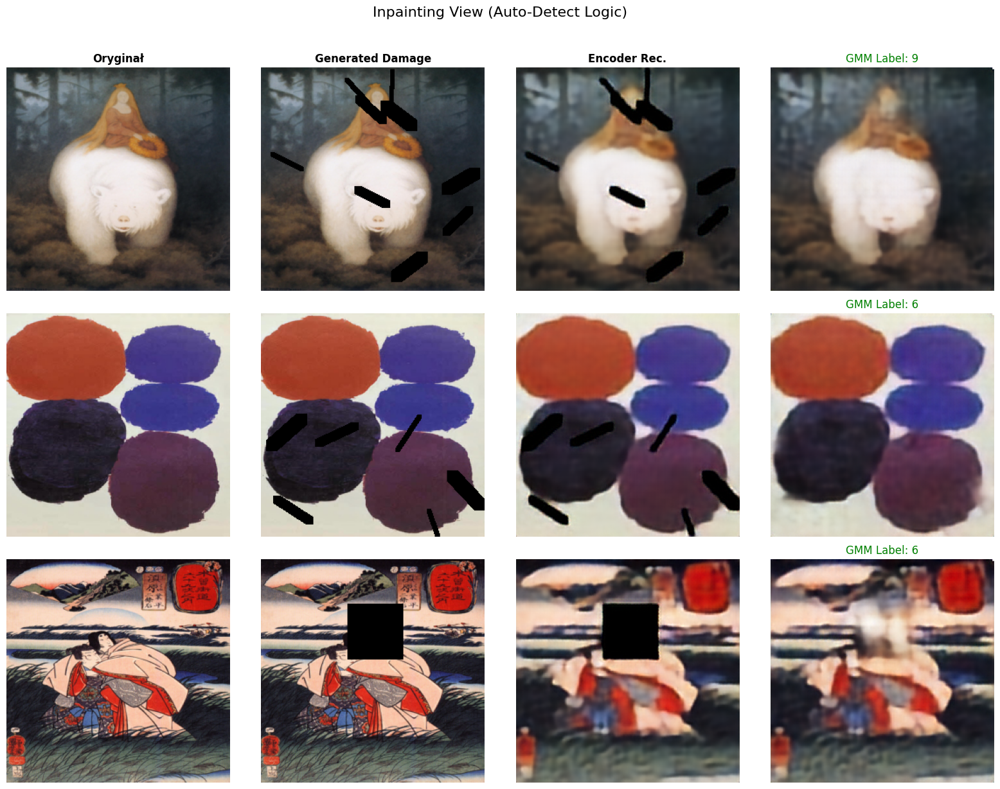

In [20]:
visualize_images_inpainter(inpainter, autoencoder, train_loader, trained_models, device)

### Super resolution

In [21]:
from src.data.load_dataset import load_paired_data, load_data
from src.modules.super_resolution import SuperResolutionModel
import numpy as np
import torch
import matplotlib.pyplot as plt
import gc

In [22]:
train_loader_small, test_loader_small, val_loader_small = load_paired_data()

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

**Uczenie lub załadowanie wag modelu Super rozdzielczości:**

In [23]:
FORCE_LEARNING = False
LOAD_BEST = True

sr_model = SuperResolutionModel(
    learning_rate=0.001,
    load_best=LOAD_BEST  
) 

if not sr_model.model_loaded or FORCE_LEARNING:
    history = sr_model.fit(
        train_loader=train_loader_small, 
        val_loader=val_loader_small,     
        epochs=100
    )

-> Wczytywanie SR z checkpoints\best_super_resolution.pt...
-> Model SR załadowany (Epoch: 29, Loss: 0.011595071849281564)


**Tworzenie dataloaderów do uczenia:**

In [24]:
train_loader, test_loader, val_loader = load_data(add_fourth_channel=True)

Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

**Wyniki 256 -> 512 -> 1024**

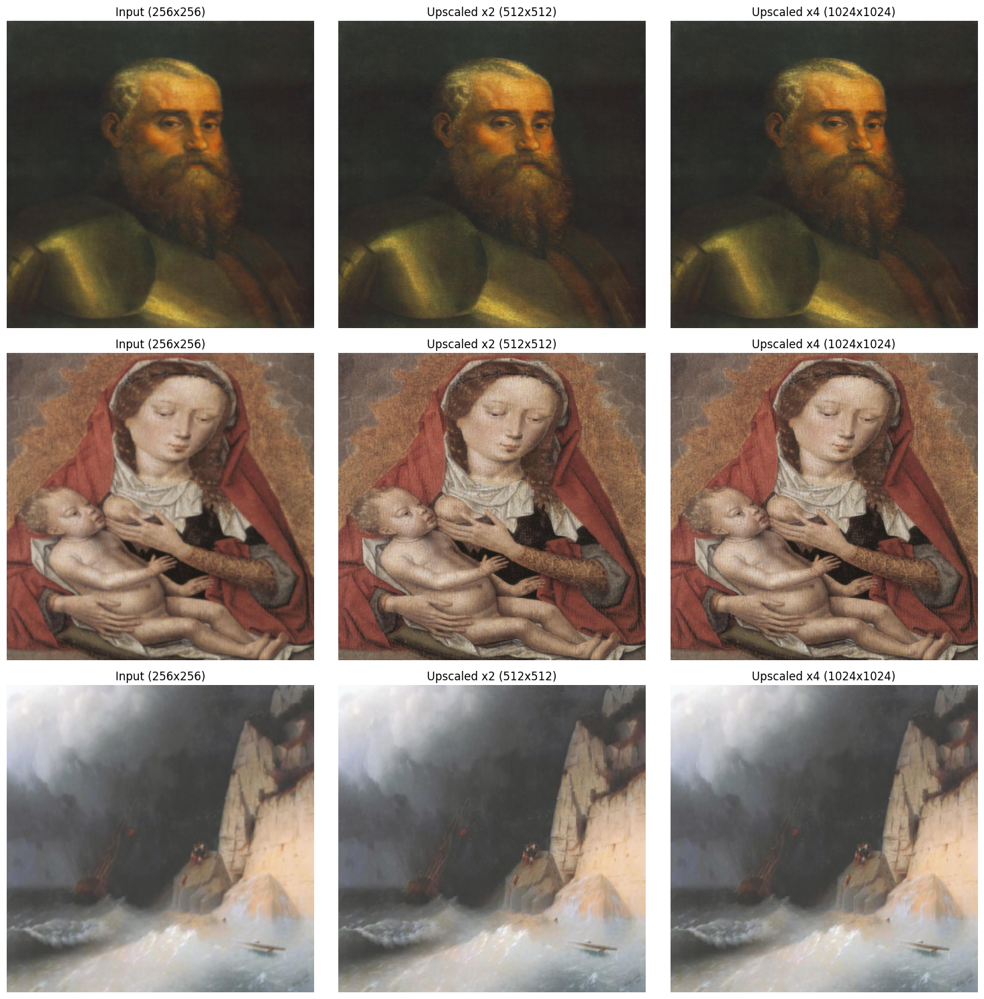

In [25]:
visualize_sr_results(sr_model, test_loader, num_samples=3)

### GUI

By uruchomić GUI, należy użyć komendy w terminalu:

In [26]:
# streamlit run gui.py
# lub używając środowiska .venv: 
# py -m streamlit run gui.py